<a href="https://colab.research.google.com/github/nafis195/Innovative_Computer_Vision_Projects/blob/main/Thresholding_and_Image_Segmentation_for_Forensic_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Thresholding and Image Segmentation for Forensic Analysis

Instruction:-

1. Convert image to grayscale and apply suitable techniques to reduce noise.
2. Use global, adaptive (mean/gaussian), and Otsu’s thresholding, and show results
side by side.
3. Apply erosion, dilation, opening, and closing to refine thresholded images.
4. Detect and draw contours on processed images to highlight key patterns or edges.
5. Which method gives the best separation of the print/tool mark from the background?
6. How does morphology improve each thresholding result?
7. Where do the methods fail? (e.g., shadows, uneven lighting, smudges, low contrast regions)
8. Strengths and weaknesses of each thresholding method.
9. Visual effectiveness post-morphology.
10. Best-suited techniques for different types of forensic images (e.g., fingerprints vs shoeprints).
11. Include method summary, processed images, contour outputs, and analysis.

Datasets:-

1. Fingerprint Dataset - https://www.kaggle.com/datasets/ruizgara/socofing
2. Footprint Database - https://www.kaggle.com/datasets/hellorahulk/footprintdatabase

Importing Libraries

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from google.colab import drive
# drive.mount('/content/drive')

Importing, Reading, Showing Images

In [2]:
def load_images_from_folder(folder_path: str, start_index = 0, end_index = None) -> list:
  """
    Load images from a folder within the specified index range.

    Args:
        folder_path (str): Path to the image folder.
        start_index (int): Starting index to load images from.
        end_index (int or None): Ending index (exclusive). If None, loads till the end.

    Returns:
        List of tuples: [(filename, image ndarray), ...]
  """
  image_files = sorted([
      f for f in os.listdir(folder_path)
      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))
  ])

  if end_index is not None:
    image_files = image_files[start_index:end_index]
  else:
    image_files = image_files[start_index:]

  loaded_images = [] # list to append the loaded images

  for i, filename in enumerate(image_files, start = start_index):
    path = os.path.join(folder_path, filename)
    img = cv2.imread(path)
    if img is not None:
      loaded_images.append((filename, img))
      print(f"[{i+1}] Loaded: {filename}")
    else:
      print(f"[{i+1}] Failed to load: {filename}")

  print(f"\n Total images loaded: {len(loaded_images)}")
  return loaded_images

In [3]:
# fingerprint images
fingerprint_image_folder = "/content/drive/MyDrive/Thresholding and Image Segmentation for Forensic Analysis/Fingerprint Dataset"
start_index = 0
end_index = 15
fingerprint_images = load_images_from_folder(fingerprint_image_folder, start_index, end_index)

[1] Loaded: 100__M_Left_index_finger.BMP
[2] Loaded: 100__M_Left_little_finger.BMP
[3] Loaded: 100__M_Left_middle_finger.BMP
[4] Loaded: 100__M_Left_ring_finger.BMP
[5] Loaded: 100__M_Left_thumb_finger.BMP
[6] Loaded: 100__M_Right_index_finger.BMP
[7] Loaded: 100__M_Right_little_finger.BMP
[8] Loaded: 100__M_Right_middle_finger.BMP
[9] Loaded: 100__M_Right_ring_finger.BMP
[10] Loaded: 100__M_Right_thumb_finger.BMP
[11] Loaded: 101__M_Left_index_finger.BMP
[12] Loaded: 101__M_Left_little_finger.BMP
[13] Loaded: 101__M_Left_middle_finger.BMP
[14] Loaded: 101__M_Left_ring_finger.BMP
[15] Loaded: 101__M_Left_thumb_finger.BMP

 Total images loaded: 15


In [4]:
# footprint images
footprint_image_folder = "/content/drive/MyDrive/Thresholding and Image Segmentation for Forensic Analysis/Footprint Dataset"
start_index = 0
end_index = 15
footprint_images = load_images_from_folder(footprint_image_folder, start_index, end_index)

[1] Loaded: 1-1.jpg
[2] Loaded: 1-2.jpg
[3] Loaded: 1-3.jpg
[4] Loaded: 1-4.jpg
[5] Loaded: 10-1.jpg
[6] Loaded: 10-2.jpg
[7] Loaded: 10-3.jpg
[8] Loaded: 10-4.jpg
[9] Loaded: 10-5.jpg
[10] Loaded: 11-1.jpeg
[11] Loaded: 11-2.jpeg
[12] Loaded: 11-3.jpeg
[13] Loaded: 11-4.jpeg
[14] Loaded: 11-5.jpeg
[15] Loaded: 12-1.jpeg

 Total images loaded: 15


In [5]:
def show_rgb_gray_images(images: list) -> None:
  """
  showing the rgb images as well as the gray images in a 3x5 plot

  Args:
    images: list of tuples (filename, image) for fingerprint or footprint image set

  Returns:
    None
  """

  rgb_images = [] # list to store all the rgb images

  for img in images:
    _, image_bgr = img
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    rgb_images.append(image_rgb)

  # Display using matplotlib
  rows, cols = 3, 5  # declaring 3x5 for 15 total images
  fig, axes = plt.subplots(rows, cols, figsize=(15, 9))
  axes = axes.flatten()

  # displaying rgb images
  for i in range(len(rgb_images)):
    axes[i].imshow(rgb_images[i])
    axes[i].axis('off')
    axes[i].set_title(f"Image {i+1}")

  plt.tight_layout()
  plt.show()

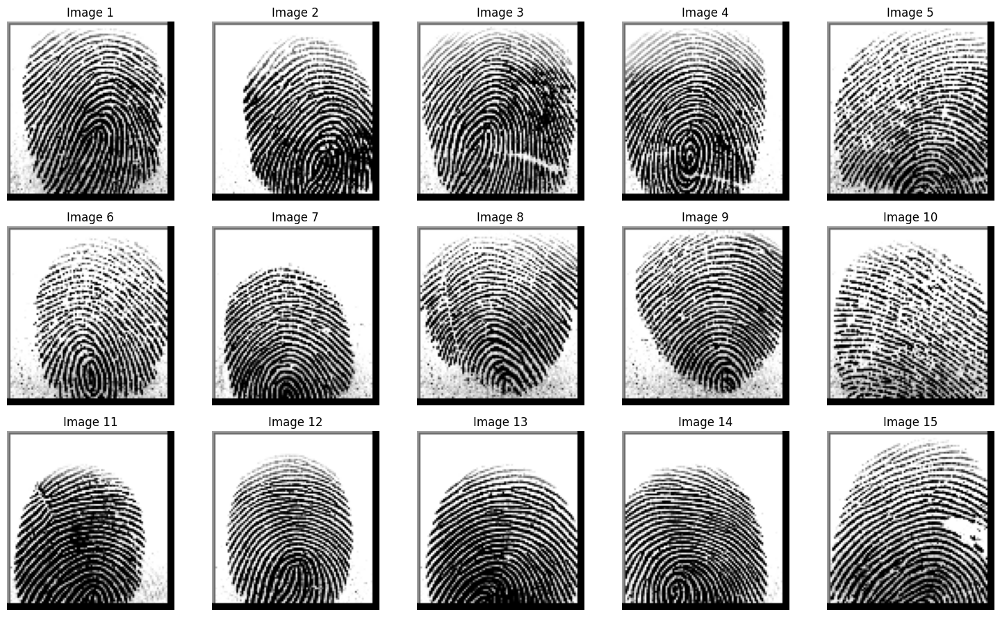

In [6]:
# fingerprint images rgb and gray
show_rgb_gray_images(fingerprint_images)

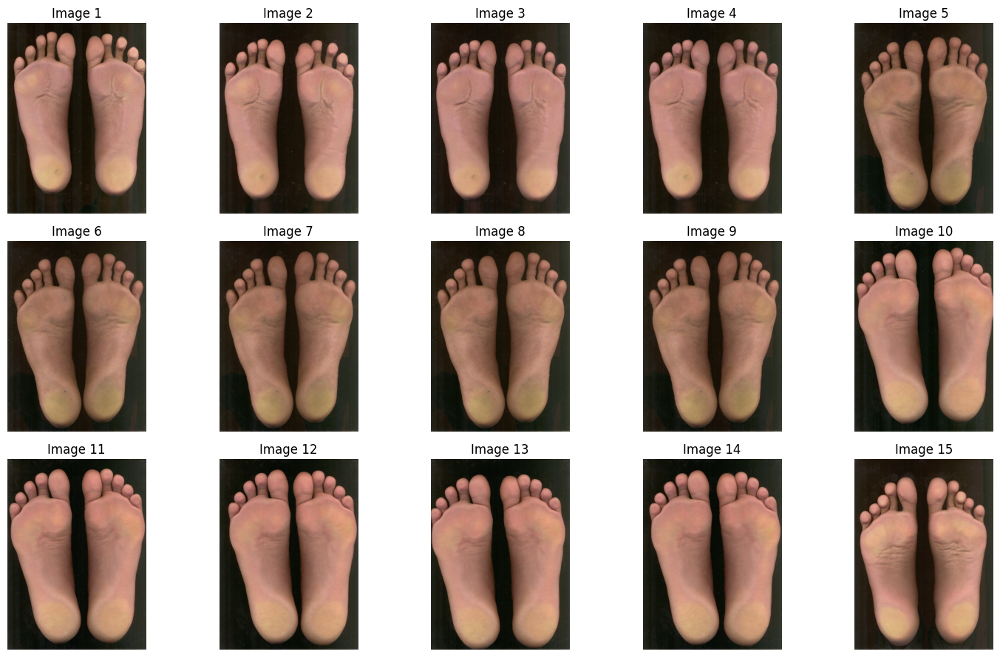

In [7]:
# footprint images
show_rgb_gray_images(footprint_images)

In [12]:
# thresholding comparison
def thresholding_comparison(image_set: list) -> None:
  """
  showing comparison of global, adaptive (mean/gaussian), and Otsu’s thresholding side by side.

  Args:
    images: list of tuples (filename, image) for fingerprint or footprint image set

  Returns:
    None
  """

  i = 1 # simple counter for image name
  for img in image_set:
    _, image_bgr = img
    image_gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY) # converting the image to grayscale
    plt.figure(figsize=(15, 5))

    # showing original image
    plt.subplot(1, 5, 1)
    plt.imshow(image_gray, cmap='gray')
    plt.title(f'Original Image {i}')
    plt.axis('off')

    # global thresholding
    _, global_threshold = cv2.threshold(image_gray, 127, 255, cv2.THRESH_BINARY)
    plt.subplot(1, 5, 2)
    plt.imshow(global_threshold, cmap='gray')
    plt.title('Global Thresholding')
    plt.axis('off')

    # mean adaptive thresholding
    mean_adaptive_threshold = cv2.adaptiveThreshold(image_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    plt.subplot(1, 5, 3)
    plt.imshow(mean_adaptive_threshold, cmap='gray')
    plt.title('Adaptive Mean')
    plt.axis('off')

    # gaussian adaptive thresholding
    gaussian_adaptive_threshold = cv2.adaptiveThreshold(image_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    plt.subplot(1, 5, 4)
    plt.imshow(gaussian_adaptive_threshold, cmap='gray')
    plt.title('Adaptive Gaussian')
    plt.axis('off')

    # otsu thresholding
    _, otsu_thresholding = cv2.threshold(image_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    plt.subplot(1, 5, 5)
    plt.imshow(otsu_thresholding, cmap='gray')
    plt.title('Otsu Thresholding')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    i += 1 # increment the counter

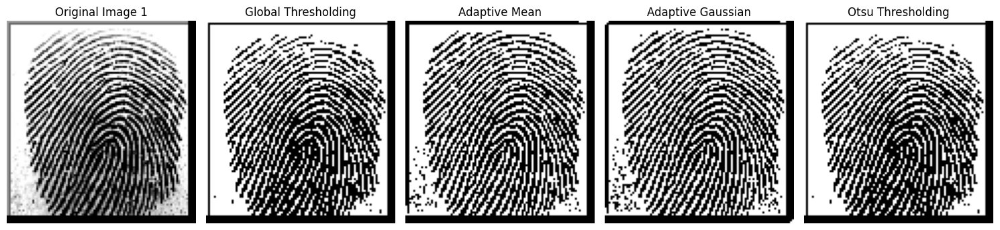

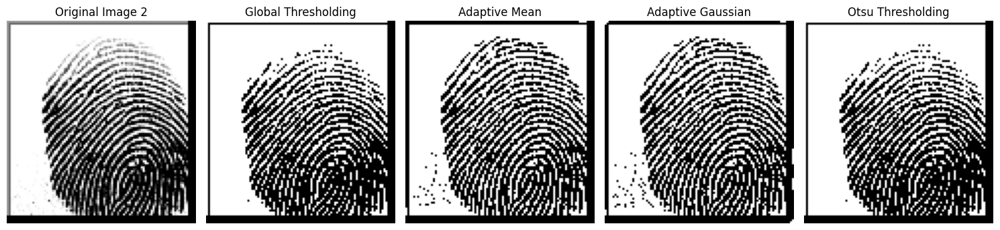

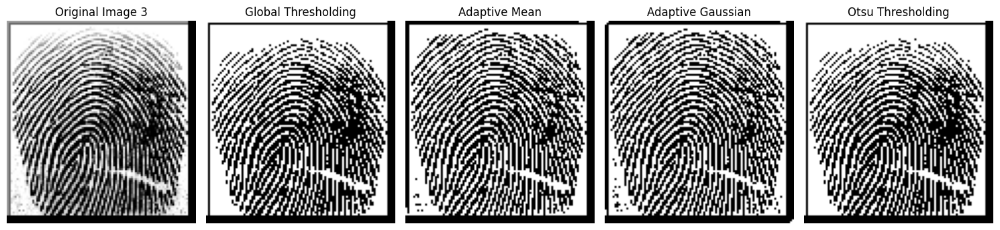

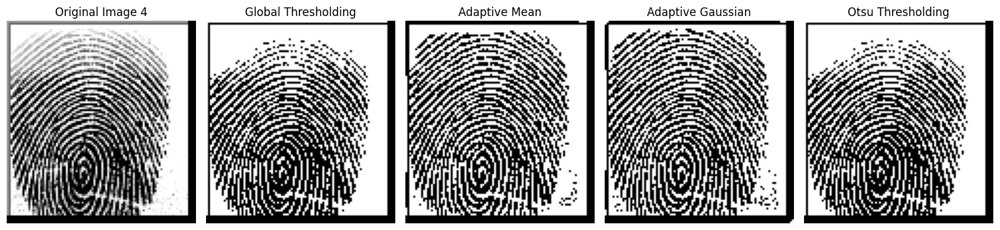

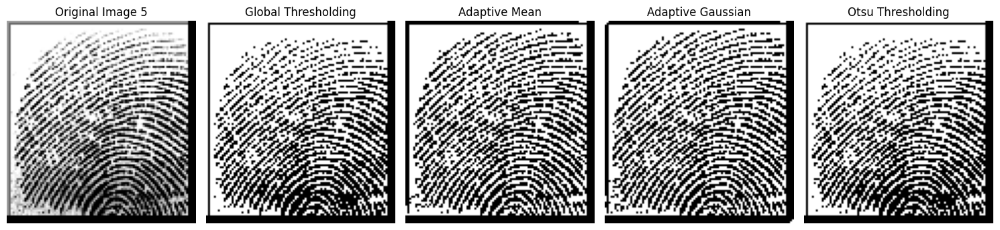

...

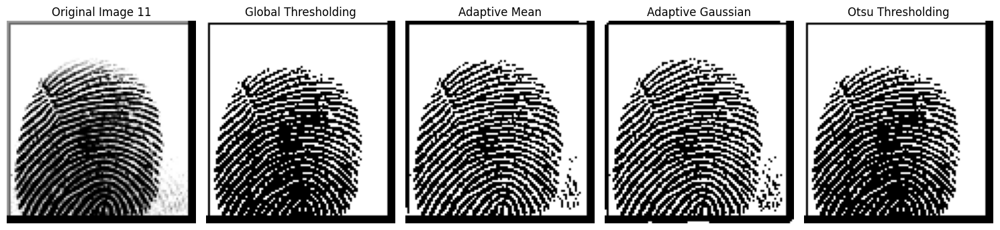

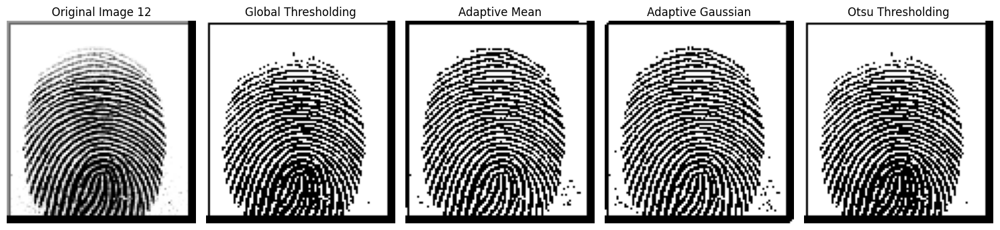

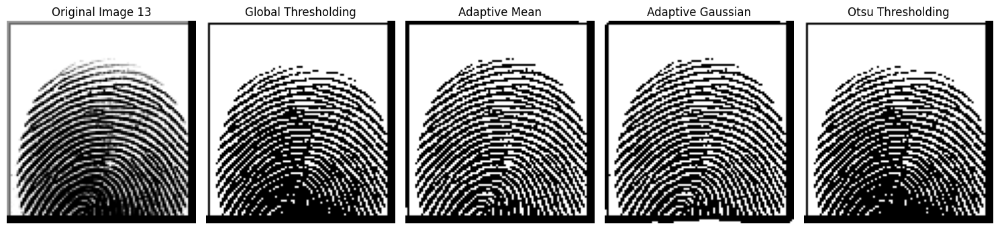

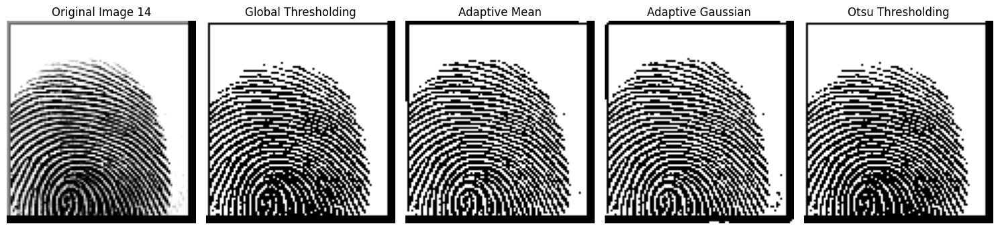

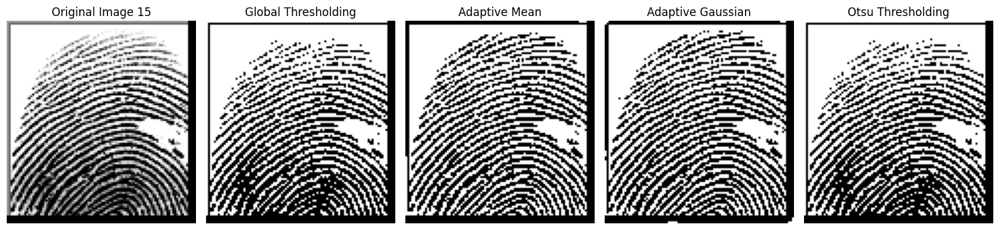

In [13]:
# thresholding comparison for fingerprint imageset
thresholding_comparison(fingerprint_images)

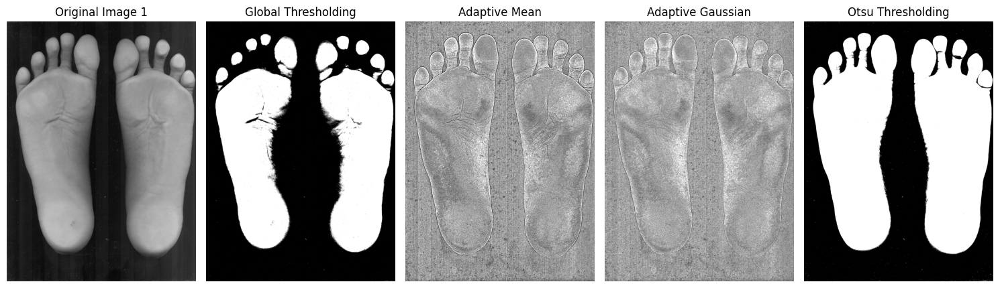

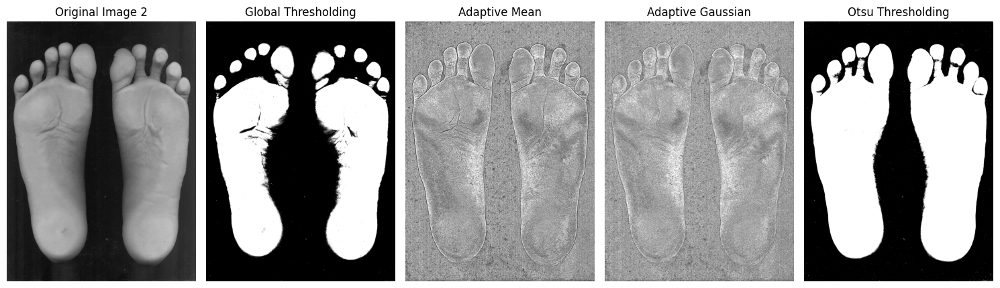

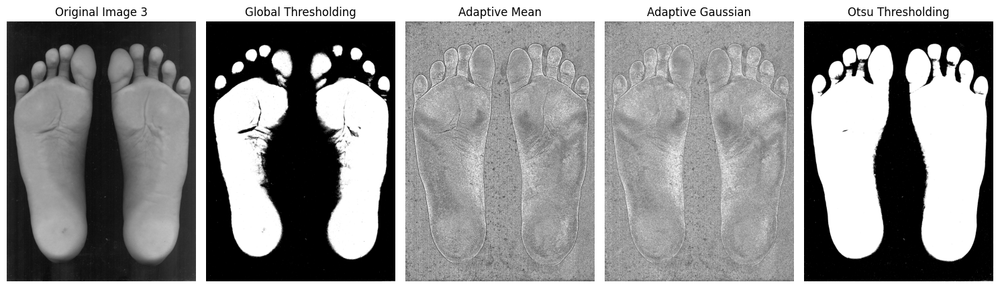

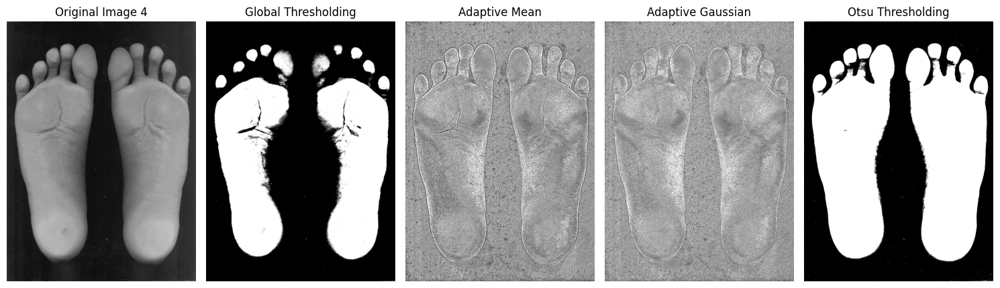

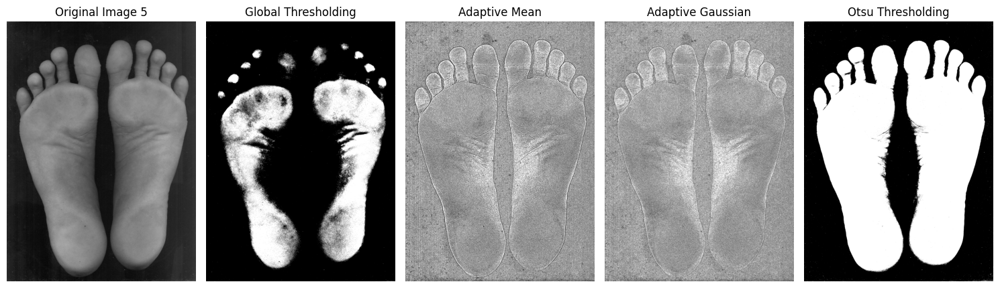

...

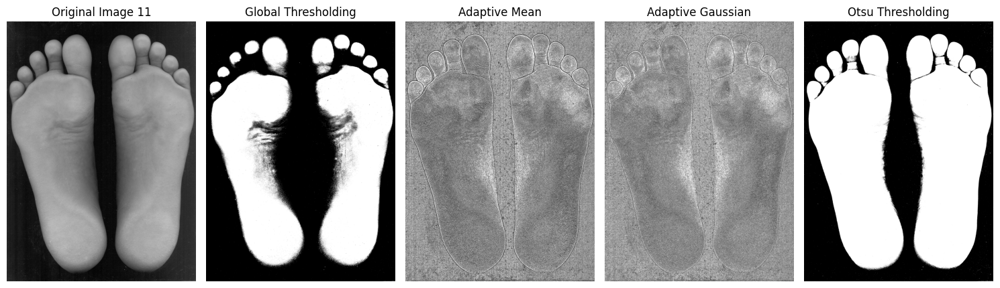

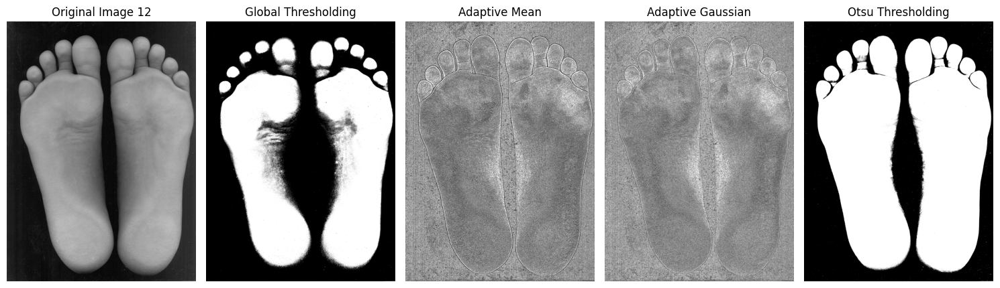

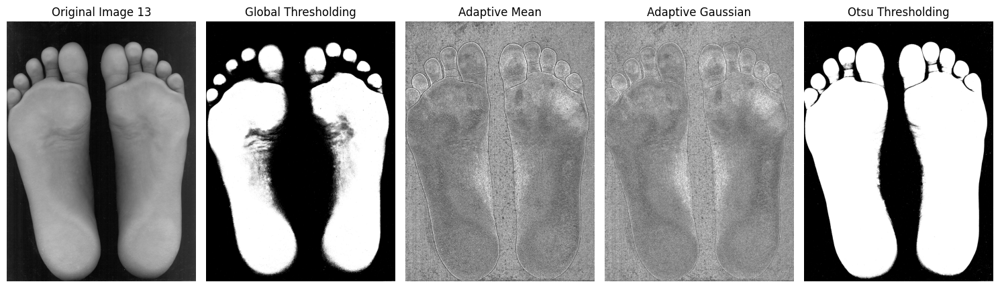

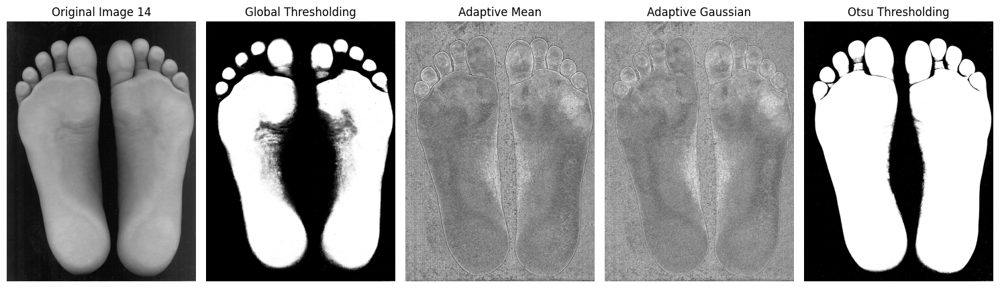

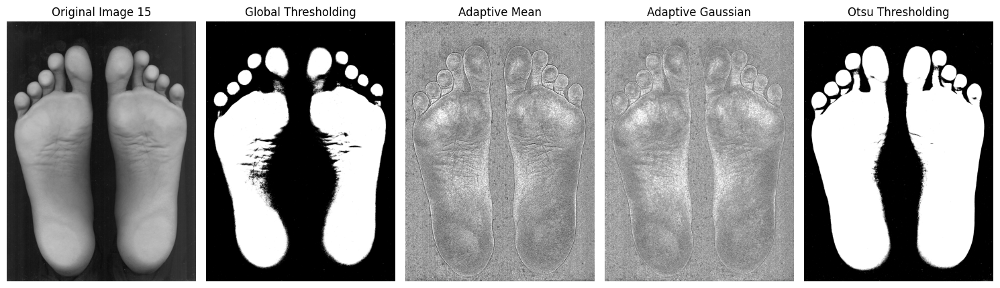

In [14]:
# thresholding comparsion for footprint images
thresholding_comparison(footprint_images)